In [2]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), ".."))

import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision.transforms import v2

from tqdm import tqdm
import wandb

from satellite2map.datasets import Maps
from satellite2map.models.generator import UnetGenerator
from satellite2map.models.discriminator import ConditionalDiscriminator
from satellite2map.losses import GeneratorLoss, DiscriminatorLoss
import satellite2map.transforms as T

from dataclasses import dataclass
import time

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Pix2Pix implementation

In [3]:
@dataclass
class hyperparameters:
    # training hyperparams
    n_epochs: int = 100
    batch_size: int = 32
    lr: float = 2e-3

hyperparams = hyperparameters()

In [4]:
# wandb.init(
#     # set the wandb project where this run will be logged
#     project="satellite2map_pix2pix",

#     # track hyperparameters and run metadata
#     config={
#     "learning_rate": hyperparams.lr,
#     "architecture": "Unet",
#     "dataset": "Maps",
#     "epochs": hyperparams.n_epochs,
#     "batch_size": hyperparams.batch_size,
#     }
# )

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: viniciusandreossi (oficina). Use `wandb login --relogin` to force relogin


## Loading data

In [5]:
transforms = T.Compose([T.Resize((256,256)),
                        T.ToTensor(),
                        T.Normalize(mean=[0.5, 0.5, 0.5],
                                     std=[0.5, 0.5, 0.5])])

train_dataset = Maps(root='../data/mod', mode='train', transform=transforms, download=False)
val_dataset   = Maps(root='../data/mod', mode='val', transform=transforms, download=False)

train_dataloader = DataLoader(train_dataset, batch_size=hyperparams.batch_size, shuffle=True)
val_dataloader   = DataLoader(val_dataset,   batch_size=hyperparams.batch_size, shuffle=True)

1 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])
2 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])
3 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])
4 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])


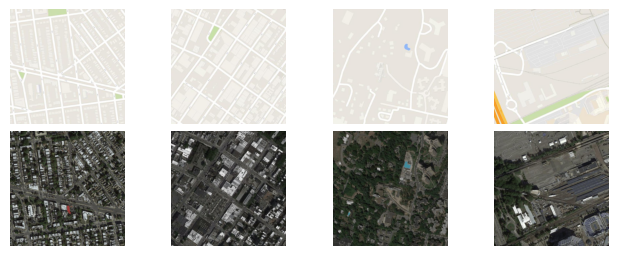

In [22]:
import matplotlib.pyplot as plt
import numpy as np

for i, (sat, map) in enumerate(train_dataset):
    i = i + 1
    print(i, sat.shape, map.shape)

    ax = plt.subplot(1, 4, i)
    plt.tight_layout()
    #ax.set_title('Satellite #{}'.format(i))
    ax.axis('off')
    sat = sat * 0.5 + 0.5
    plt.imshow(sat.permute((1, 2, 0)).numpy())

    ax = plt.subplot(2, 4, i)
    plt.tight_layout()
    #ax.set_title('Map #{}'.format(i))
    ax.axis('off')
    map = map * 0.5 + 0.5
    plt.imshow(map.permute((1, 2, 0)).numpy())

    if i == 4:
        plt.show()
        break

# Preparing for training

In [11]:
generator = UnetGenerator().to(DEVICE)
discriminator = ConditionalDiscriminator().to(DEVICE)

g_criterion = GeneratorLoss()
d_criterion = DiscriminatorLoss()

g_optimizer = torch.optim.Adam(generator.parameters(), lr=hyperparams.lr, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=hyperparams.lr, betas=(0.5, 0.999))

## Training loop

[Epoch 1/100]
Training


100%|██████████| 35/35 [07:16<00:00, 12.47s/it]


Validation


100%|██████████| 35/35 [03:14<00:00,  5.57s/it]


[G loss: 12.755755424499512] [D loss: 0.5775458812713623] ETA: 436.36306834220886
maps: 1.0, 0.2627451419830322
gen maps: 0.9999954700469971, 0.016183262690901756
maps: 1.0, 0.2705882787704468
gen maps: 0.9999987483024597, -0.26948732137680054
maps: 1.0, 0.2862745523452759
gen maps: 0.9999999403953552, -0.013731402345001698
maps: 1.0, -0.9372549057006836
gen maps: 1.0, -0.4838893711566925


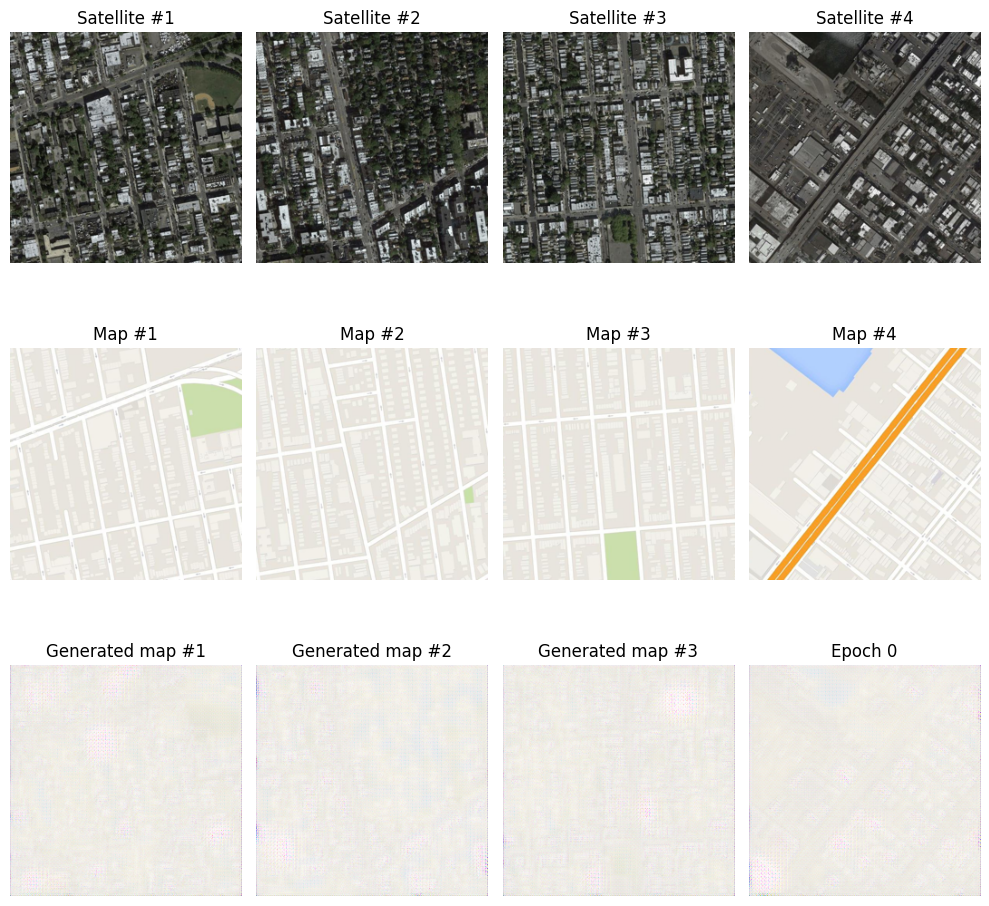

[Epoch 2/100]
Training


100%|██████████| 35/35 [07:58<00:00, 13.68s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.46s/it]


[G loss: 11.721698760986328] [D loss: 0.4967744052410126] ETA: 478.8234512805939
[Epoch 3/100]
Training


100%|██████████| 35/35 [07:02<00:00, 12.06s/it]


Validation


100%|██████████| 35/35 [03:00<00:00,  5.16s/it]


[G loss: 19.374492645263672] [D loss: 0.9597423076629639] ETA: 422.19293904304504
[Epoch 4/100]
Training


100%|██████████| 35/35 [06:54<00:00, 11.85s/it]


Validation


100%|██████████| 35/35 [02:59<00:00,  5.12s/it]


[G loss: 13.493584632873535] [D loss: 0.6859985589981079] ETA: 414.76394414901733
[Epoch 5/100]
Training


100%|██████████| 35/35 [07:00<00:00, 12.00s/it]


Validation


100%|██████████| 35/35 [03:02<00:00,  5.21s/it]


[G loss: 15.275110244750977] [D loss: 0.5373458862304688] ETA: 420.0912125110626
[Epoch 6/100]
Training


100%|██████████| 35/35 [07:03<00:00, 12.10s/it]


Validation


100%|██████████| 35/35 [03:09<00:00,  5.42s/it]


[G loss: 19.5505428314209] [D loss: 0.9434031248092651] ETA: 423.5453803539276
[Epoch 7/100]
Training


100%|██████████| 35/35 [07:18<00:00, 12.52s/it]


Validation


100%|██████████| 35/35 [03:10<00:00,  5.44s/it]


[G loss: 12.197636604309082] [D loss: 0.7212156057357788] ETA: 438.16907811164856
[Epoch 8/100]
Training


100%|██████████| 35/35 [07:09<00:00, 12.28s/it]


Validation


100%|██████████| 35/35 [03:06<00:00,  5.34s/it]


[G loss: 11.882316589355469] [D loss: 0.46503713726997375] ETA: 429.65471267700195
[Epoch 9/100]
Training


100%|██████████| 35/35 [06:56<00:00, 11.89s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.46s/it]


[G loss: 9.790452003479004] [D loss: 0.3451525568962097] ETA: 416.1650421619415
[Epoch 10/100]
Training


100%|██████████| 35/35 [07:33<00:00, 12.95s/it]


Validation


100%|██████████| 35/35 [03:17<00:00,  5.64s/it]


[G loss: 9.912132263183594] [D loss: 0.23694762587547302] ETA: 453.1100947856903
[Epoch 11/100]
Training


100%|██████████| 35/35 [07:30<00:00, 12.87s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.46s/it]


[G loss: 10.192964553833008] [D loss: 0.6300628781318665] ETA: 450.4665162563324
maps: 1.0, 0.2627451419830322
gen maps: 0.9973533749580383, -0.6889582872390747
maps: 1.0, 0.2705882787704468
gen maps: 0.9993674159049988, -0.990339994430542
maps: 1.0, 0.2862745523452759
gen maps: 0.9997057318687439, -0.9936821460723877
maps: 1.0, -0.9372549057006836
gen maps: 0.9997497797012329, -0.999566376209259


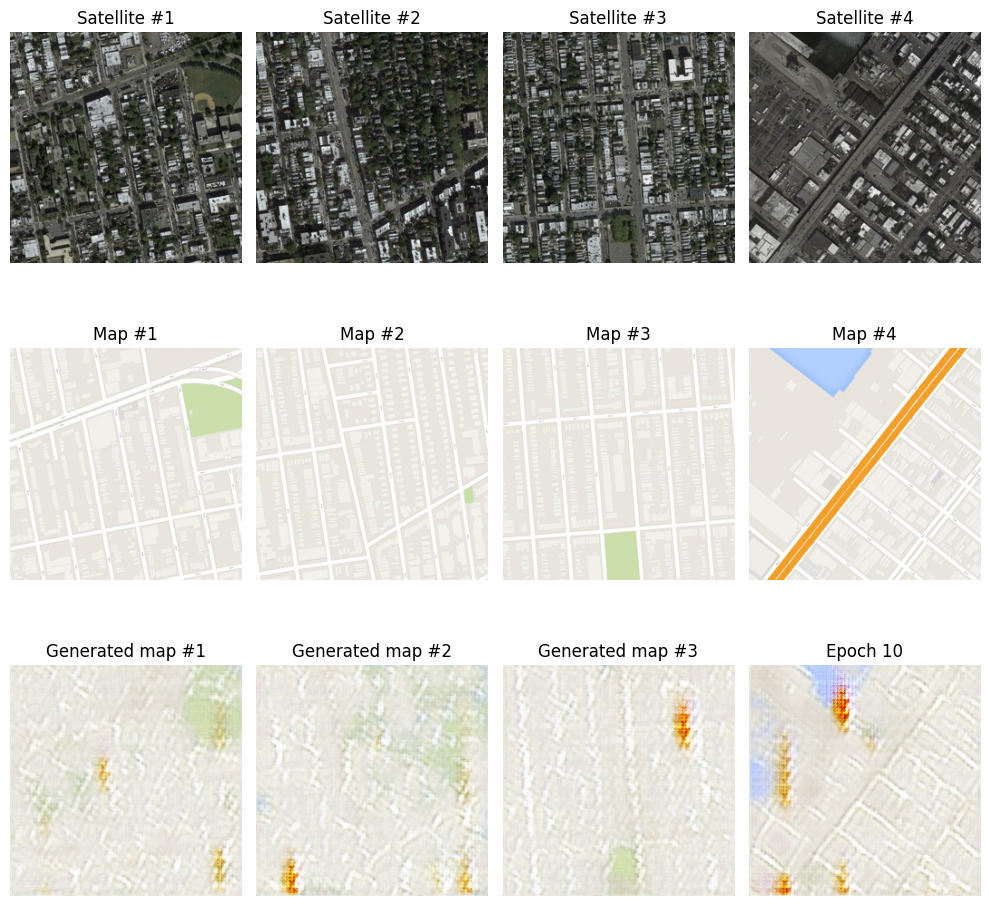

[Epoch 12/100]
Training


100%|██████████| 35/35 [07:10<00:00, 12.29s/it]


Validation


100%|██████████| 35/35 [03:10<00:00,  5.43s/it]


[G loss: 9.669940948486328] [D loss: 0.457092821598053] ETA: 430.260320186615
[Epoch 13/100]
Training


100%|██████████| 35/35 [07:09<00:00, 12.28s/it]


Validation


100%|██████████| 35/35 [03:08<00:00,  5.40s/it]


[G loss: 10.983807563781738] [D loss: 0.23764947056770325] ETA: 429.677925825119
[Epoch 14/100]
Training


100%|██████████| 35/35 [07:07<00:00, 12.23s/it]


Validation


100%|██████████| 35/35 [03:08<00:00,  5.40s/it]


[G loss: 11.050753593444824] [D loss: 0.24294179677963257] ETA: 427.9320778846741
[Epoch 15/100]
Training


100%|██████████| 35/35 [07:03<00:00, 12.09s/it]


Validation


100%|██████████| 35/35 [03:07<00:00,  5.35s/it]


[G loss: 7.839385509490967] [D loss: 0.4392530918121338] ETA: 423.31594824790955
[Epoch 16/100]
Training


100%|██████████| 35/35 [07:03<00:00, 12.10s/it]


Validation


100%|██████████| 35/35 [03:10<00:00,  5.44s/it]


[G loss: 16.692214965820312] [D loss: 0.5880466103553772] ETA: 423.43967962265015
[Epoch 17/100]
Training


100%|██████████| 35/35 [07:05<00:00, 12.15s/it]


Validation


100%|██████████| 35/35 [03:02<00:00,  5.21s/it]


[G loss: 10.938058853149414] [D loss: 1.3438071012496948] ETA: 425.4280412197113
[Epoch 18/100]
Training


100%|██████████| 35/35 [07:05<00:00, 12.15s/it]


Validation


100%|██████████| 35/35 [03:09<00:00,  5.43s/it]


[G loss: 9.839922904968262] [D loss: 0.36760520935058594] ETA: 425.1034264564514
[Epoch 19/100]
Training


100%|██████████| 35/35 [07:07<00:00, 12.22s/it]


Validation


100%|██████████| 35/35 [03:22<00:00,  5.79s/it]


[G loss: 13.360246658325195] [D loss: 0.6178691387176514] ETA: 427.61995339393616
[Epoch 20/100]
Training


100%|██████████| 35/35 [07:37<00:00, 13.06s/it]


Validation


100%|██████████| 35/35 [03:28<00:00,  5.95s/it]


[G loss: 9.8160400390625] [D loss: 0.4451941251754761] ETA: 457.2671000957489
[Epoch 21/100]
Training


100%|██████████| 35/35 [07:48<00:00, 13.39s/it]


Validation


100%|██████████| 35/35 [03:26<00:00,  5.89s/it]


[G loss: 9.721839904785156] [D loss: 0.36546146869659424] ETA: 468.4897584915161
maps: 1.0, 0.2627451419830322
gen maps: 0.9999961853027344, -0.4879617393016815
maps: 1.0, 0.2705882787704468
gen maps: 0.9999950528144836, -0.2060052901506424
maps: 1.0, 0.2862745523452759
gen maps: 0.9999980330467224, -0.3087083399295807
maps: 1.0, -0.9372549057006836
gen maps: 0.9998440742492676, 0.37329041957855225


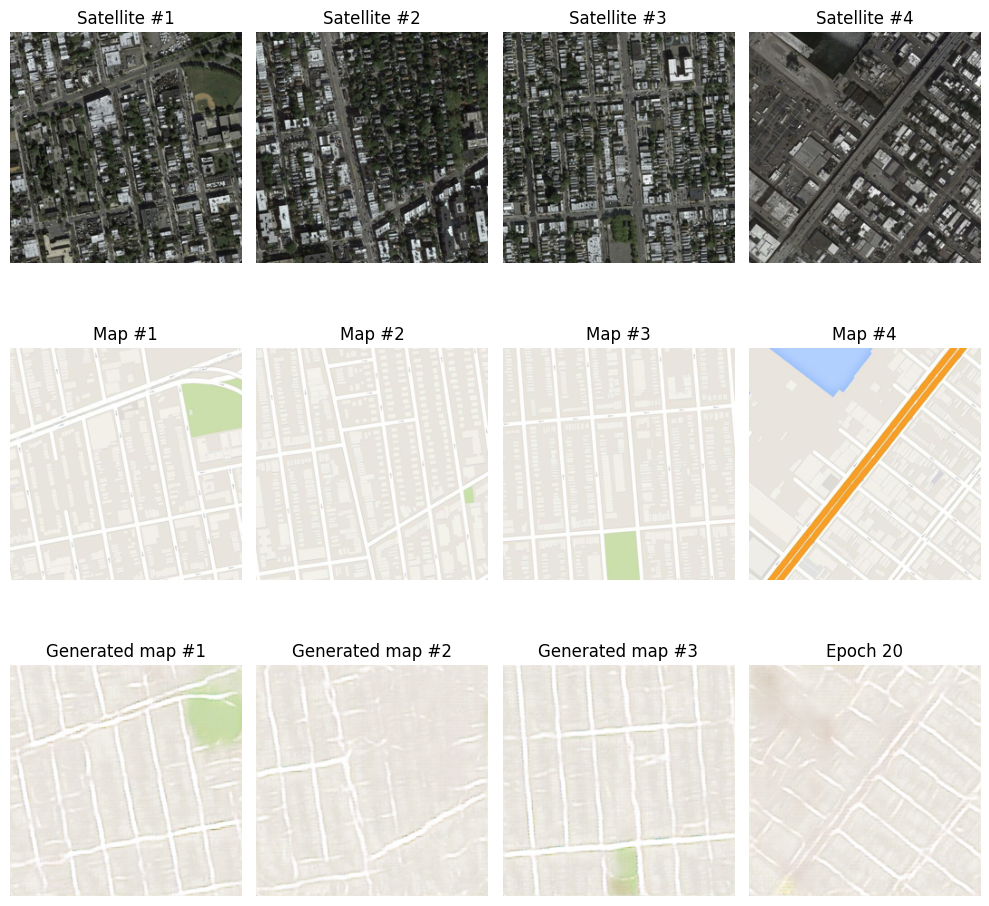

[Epoch 22/100]
Training


100%|██████████| 35/35 [07:50<00:00, 13.43s/it]


Validation


100%|██████████| 35/35 [03:31<00:00,  6.03s/it]


[G loss: 9.797380447387695] [D loss: 0.6060039401054382] ETA: 470.029935836792
[Epoch 23/100]
Training


100%|██████████| 35/35 [08:04<00:00, 13.84s/it]


Validation


100%|██████████| 35/35 [03:31<00:00,  6.04s/it]


[G loss: 8.909124374389648] [D loss: 0.5749061107635498] ETA: 484.508154630661
[Epoch 24/100]
Training


100%|██████████| 35/35 [07:59<00:00, 13.70s/it]


Validation


100%|██████████| 35/35 [03:26<00:00,  5.91s/it]


[G loss: 6.914657115936279] [D loss: 0.609194278717041] ETA: 479.3493700027466
[Epoch 25/100]
Training


100%|██████████| 35/35 [07:57<00:00, 13.64s/it]


Validation


100%|██████████| 35/35 [03:36<00:00,  6.17s/it]


[G loss: 8.655601501464844] [D loss: 0.656821072101593] ETA: 477.2516391277313
[Epoch 26/100]
Training


100%|██████████| 35/35 [07:58<00:00, 13.67s/it]


Validation


100%|██████████| 35/35 [03:31<00:00,  6.05s/it]


[G loss: 9.896221160888672] [D loss: 0.9432300925254822] ETA: 478.5633273124695
[Epoch 27/100]
Training


100%|██████████| 35/35 [08:05<00:00, 13.86s/it]


Validation


100%|██████████| 35/35 [03:28<00:00,  5.95s/it]


[G loss: 11.369909286499023] [D loss: 0.48309582471847534] ETA: 485.2585287094116
[Epoch 28/100]
Training


100%|██████████| 35/35 [07:56<00:00, 13.63s/it]


Validation


100%|██████████| 35/35 [03:39<00:00,  6.27s/it]


[G loss: 9.36550235748291] [D loss: 0.8755359649658203] ETA: 476.8991138935089
[Epoch 29/100]
Training


100%|██████████| 35/35 [08:11<00:00, 14.04s/it]


Validation


100%|██████████| 35/35 [03:34<00:00,  6.12s/it]


[G loss: 9.655900955200195] [D loss: 0.4202820658683777] ETA: 491.3886752128601
[Epoch 30/100]
Training


100%|██████████| 35/35 [08:00<00:00, 13.72s/it]


Validation


100%|██████████| 35/35 [03:39<00:00,  6.27s/it]


[G loss: 9.17449951171875] [D loss: 0.6748467683792114] ETA: 480.11664295196533
[Epoch 31/100]
Training


100%|██████████| 35/35 [08:00<00:00, 13.73s/it]


Validation


100%|██████████| 35/35 [03:36<00:00,  6.19s/it]


[G loss: 10.114709854125977] [D loss: 1.0367650985717773] ETA: 480.6456286907196
maps: 1.0, 0.2627451419830322
gen maps: 0.9999985694885254, -0.05568872392177582
maps: 1.0, 0.2705882787704468
gen maps: 0.9999979138374329, 0.37957361340522766
maps: 1.0, 0.2862745523452759
gen maps: 0.9999984502792358, 0.25827500224113464
maps: 1.0, -0.9372549057006836
gen maps: 1.0, -0.6728344559669495


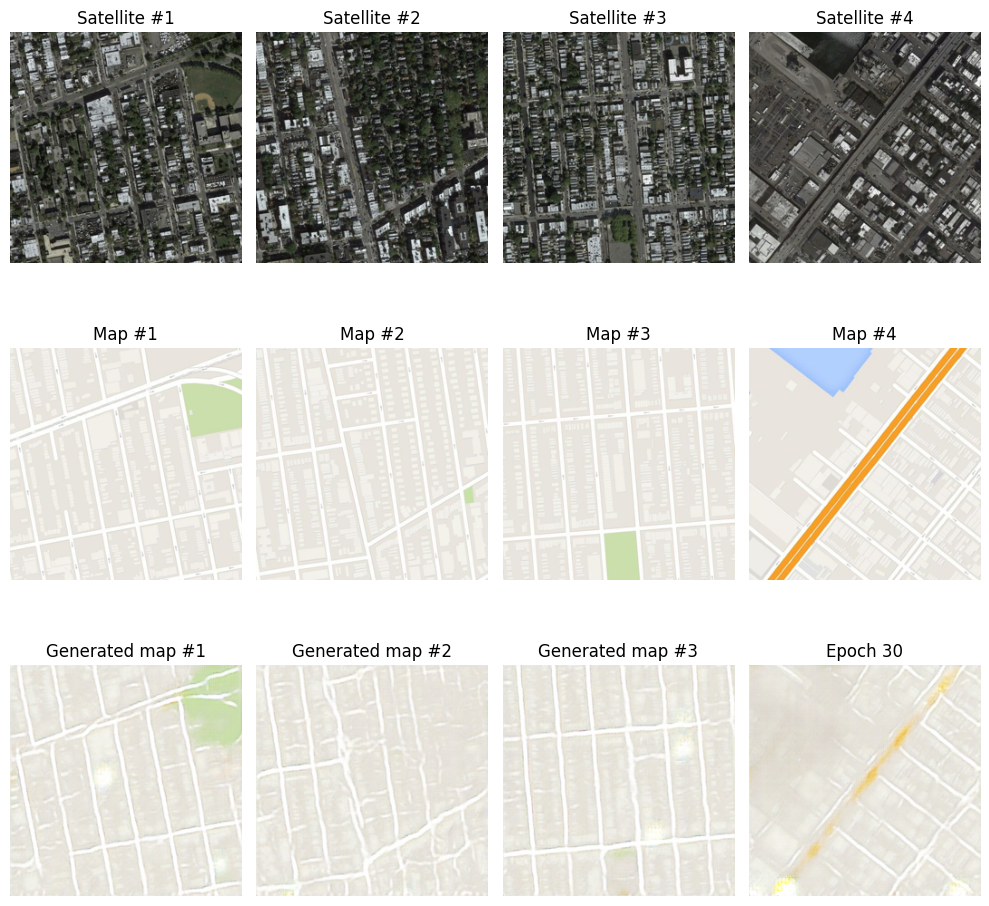

[Epoch 32/100]
Training


100%|██████████| 35/35 [08:04<00:00, 13.83s/it]


Validation


100%|██████████| 35/35 [03:36<00:00,  6.18s/it]


[G loss: 8.486990928649902] [D loss: 0.6917436718940735] ETA: 484.21060252189636
[Epoch 33/100]
Training


100%|██████████| 35/35 [08:07<00:00, 13.92s/it]


Validation


100%|██████████| 35/35 [03:38<00:00,  6.24s/it]


[G loss: 9.583845138549805] [D loss: 0.6870058178901672] ETA: 487.05427742004395
[Epoch 34/100]
Training


100%|██████████| 35/35 [07:59<00:00, 13.69s/it]


Validation


100%|██████████| 35/35 [03:33<00:00,  6.09s/it]


[G loss: 8.731327056884766] [D loss: 0.5915349721908569] ETA: 479.2456350326538
[Epoch 35/100]
Training


100%|██████████| 35/35 [08:07<00:00, 13.94s/it]


Validation


100%|██████████| 35/35 [03:28<00:00,  5.96s/it]


[G loss: 11.345648765563965] [D loss: 0.4634286165237427] ETA: 487.8835003376007
[Epoch 36/100]
Training


100%|██████████| 35/35 [07:59<00:00, 13.71s/it]


Validation


100%|██████████| 35/35 [03:31<00:00,  6.05s/it]


[G loss: 5.49501895904541] [D loss: 0.7869146466255188] ETA: 479.7349853515625
[Epoch 37/100]
Training


100%|██████████| 35/35 [08:11<00:00, 14.06s/it]


Validation


100%|██████████| 35/35 [03:33<00:00,  6.09s/it]


[G loss: 9.075335502624512] [D loss: 0.3661952018737793] ETA: 491.9932746887207
[Epoch 38/100]
Training


100%|██████████| 35/35 [08:01<00:00, 13.75s/it]


Validation


100%|██████████| 35/35 [03:31<00:00,  6.04s/it]


[G loss: 15.687748908996582] [D loss: 0.4986281394958496] ETA: 481.2137589454651
[Epoch 39/100]
Training


100%|██████████| 35/35 [08:00<00:00, 13.73s/it]


Validation


100%|██████████| 35/35 [03:28<00:00,  5.97s/it]


[G loss: 6.698066234588623] [D loss: 0.5587794780731201] ETA: 480.5765793323517
[Epoch 40/100]
Training


100%|██████████| 35/35 [07:56<00:00, 13.62s/it]


Validation


100%|██████████| 35/35 [03:32<00:00,  6.07s/it]


[G loss: 8.977249145507812] [D loss: 1.064467191696167] ETA: 476.72944259643555
[Epoch 41/100]
Training


100%|██████████| 35/35 [07:57<00:00, 13.63s/it]


Validation


100%|██████████| 35/35 [03:30<00:00,  6.02s/it]


[G loss: 8.985928535461426] [D loss: 0.47262418270111084] ETA: 477.2214629650116
maps: 1.0, 0.2627451419830322
gen maps: 0.9999997019767761, -0.24551178514957428
maps: 1.0, 0.2705882787704468
gen maps: 0.9999971389770508, 0.006730039604008198
maps: 1.0, 0.2862745523452759
gen maps: 0.9999988675117493, -0.1649048775434494
maps: 1.0, -0.9372549057006836
gen maps: 0.9999973773956299, -0.8123624920845032


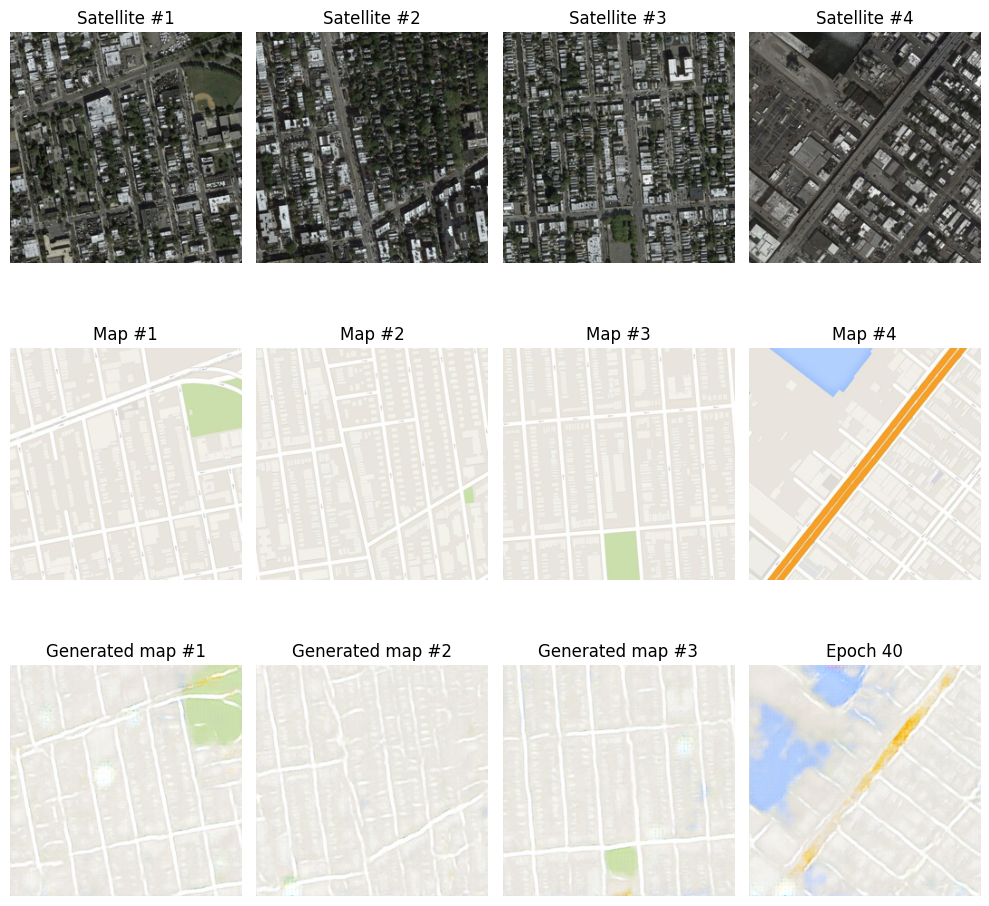

[Epoch 42/100]
Training


100%|██████████| 35/35 [07:58<00:00, 13.68s/it]


Validation


100%|██████████| 35/35 [03:32<00:00,  6.08s/it]


[G loss: 8.7185697555542] [D loss: 0.6886935830116272] ETA: 478.8552007675171
[Epoch 43/100]
Training


100%|██████████| 35/35 [08:00<00:00, 13.74s/it]


Validation


100%|██████████| 35/35 [03:32<00:00,  6.08s/it]


[G loss: 7.350523948669434] [D loss: 0.5883997678756714] ETA: 480.77787685394287
[Epoch 44/100]
Training


100%|██████████| 35/35 [08:03<00:00, 13.83s/it]


Validation


100%|██████████| 35/35 [03:37<00:00,  6.21s/it]


[G loss: 9.057888984680176] [D loss: 0.37048545479774475] ETA: 483.9822163581848
[Epoch 45/100]
Training


100%|██████████| 35/35 [07:57<00:00, 13.66s/it]


Validation


100%|██████████| 35/35 [03:34<00:00,  6.13s/it]


[G loss: 9.880023956298828] [D loss: 0.6622419357299805] ETA: 477.9574189186096
[Epoch 46/100]
Training


100%|██████████| 35/35 [08:07<00:00, 13.92s/it]


Validation


100%|██████████| 35/35 [03:36<00:00,  6.19s/it]


[G loss: 9.272595405578613] [D loss: 0.5684490203857422] ETA: 487.35955905914307
[Epoch 47/100]
Training


100%|██████████| 35/35 [07:58<00:00, 13.68s/it]


Validation


100%|██████████| 35/35 [03:31<00:00,  6.04s/it]


[G loss: 9.328686714172363] [D loss: 0.46001267433166504] ETA: 478.70261573791504
[Epoch 48/100]
Training


100%|██████████| 35/35 [07:56<00:00, 13.62s/it]


Validation


100%|██████████| 35/35 [03:28<00:00,  5.95s/it]


[G loss: 8.390880584716797] [D loss: 0.4977954030036926] ETA: 476.714834690094
[Epoch 49/100]
Training


100%|██████████| 35/35 [08:00<00:00, 13.74s/it]


Validation


100%|██████████| 35/35 [03:25<00:00,  5.87s/it]


[G loss: 8.423259735107422] [D loss: 0.6423908472061157] ETA: 480.78236150741577
[Epoch 50/100]
Training


100%|██████████| 35/35 [07:57<00:00, 13.65s/it]


Validation


100%|██████████| 35/35 [03:25<00:00,  5.87s/it]


[G loss: 8.418267250061035] [D loss: 1.0479975938796997] ETA: 477.740829706192
[Epoch 51/100]
Training


100%|██████████| 35/35 [07:53<00:00, 13.52s/it]


Validation


100%|██████████| 35/35 [03:22<00:00,  5.80s/it]


[G loss: 8.603769302368164] [D loss: 0.47869959473609924] ETA: 473.07220435142517
maps: 1.0, 0.2627451419830322
gen maps: 0.9999995231628418, 0.0832684189081192
maps: 1.0, 0.2705882787704468
gen maps: 0.9999962449073792, 0.35259926319122314
maps: 1.0, 0.2862745523452759
gen maps: 0.9999997019767761, -0.20674940943717957
maps: 1.0, -0.9372549057006836
gen maps: 1.0, -0.9470758438110352


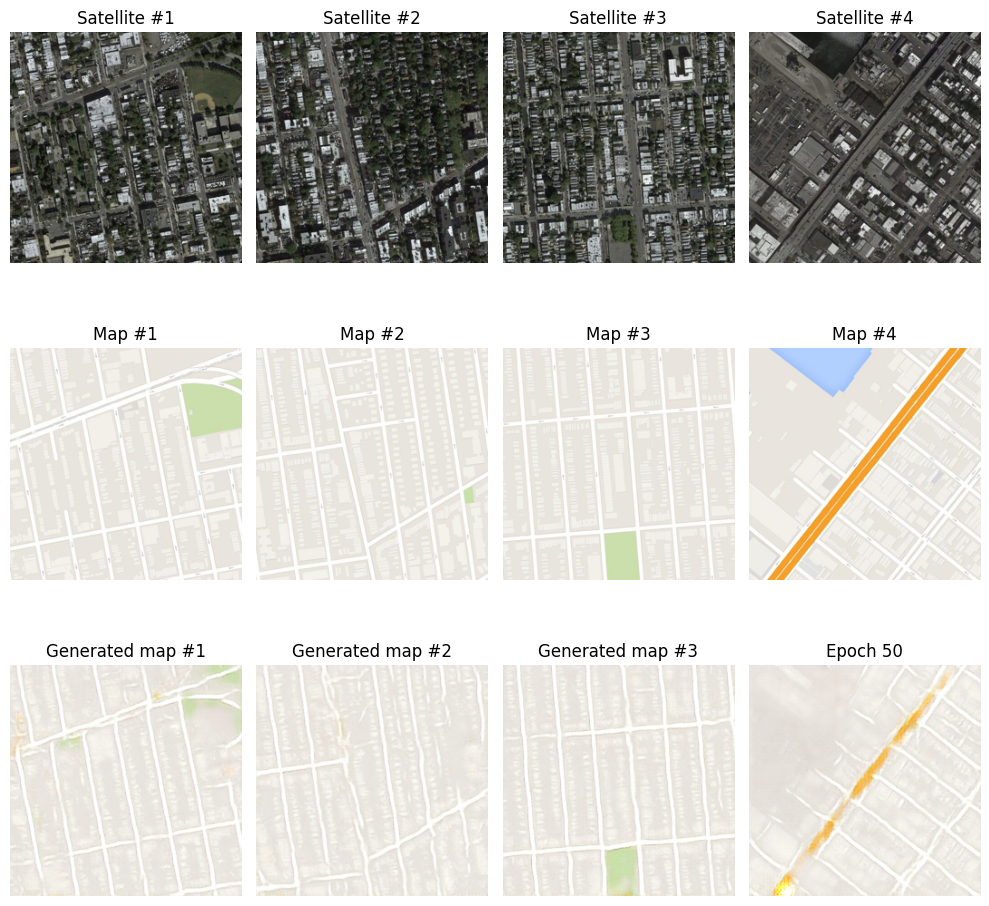

[Epoch 52/100]
Training


100%|██████████| 35/35 [07:51<00:00, 13.46s/it]


Validation


100%|██████████| 35/35 [03:23<00:00,  5.82s/it]


[G loss: 7.375014305114746] [D loss: 0.546759307384491] ETA: 471.15928888320923
[Epoch 53/100]
Training


100%|██████████| 35/35 [07:43<00:00, 13.25s/it]


Validation


100%|██████████| 35/35 [03:24<00:00,  5.84s/it]


[G loss: 13.160045623779297] [D loss: 0.6326876878738403] ETA: 463.90718603134155
[Epoch 54/100]
Training


100%|██████████| 35/35 [08:37<00:00, 14.78s/it]


Validation


100%|██████████| 35/35 [04:06<00:00,  7.04s/it]


[G loss: 11.12631607055664] [D loss: 0.4434698224067688] ETA: 517.3302578926086
[Epoch 55/100]
Training


100%|██████████| 35/35 [07:50<00:00, 13.44s/it]


Validation


100%|██████████| 35/35 [03:19<00:00,  5.71s/it]


[G loss: 8.31832218170166] [D loss: 0.6127781271934509] ETA: 470.3239755630493
[Epoch 56/100]
Training


100%|██████████| 35/35 [07:50<00:00, 13.45s/it]


Validation


100%|██████████| 35/35 [03:21<00:00,  5.76s/it]


[G loss: 10.024487495422363] [D loss: 0.4019343852996826] ETA: 470.7264370918274
[Epoch 57/100]
Training


100%|██████████| 35/35 [07:41<00:00, 13.19s/it]


Validation


100%|██████████| 35/35 [03:25<00:00,  5.87s/it]


[G loss: 7.912989616394043] [D loss: 0.6797875165939331] ETA: 461.53591537475586
[Epoch 58/100]
Training


100%|██████████| 35/35 [07:37<00:00, 13.08s/it]


Validation


100%|██████████| 35/35 [03:24<00:00,  5.84s/it]


[G loss: 7.669482231140137] [D loss: 0.44255614280700684] ETA: 457.89888882637024
[Epoch 59/100]
Training


100%|██████████| 35/35 [07:38<00:00, 13.11s/it]


Validation


100%|██████████| 35/35 [03:25<00:00,  5.86s/it]


[G loss: 7.231623649597168] [D loss: 0.6579190492630005] ETA: 458.9151465892792
[Epoch 60/100]
Training


100%|██████████| 35/35 [07:42<00:00, 13.21s/it]


Validation


100%|██████████| 35/35 [03:24<00:00,  5.83s/it]


[G loss: 9.22679615020752] [D loss: 0.3728380799293518] ETA: 462.3187692165375
[Epoch 61/100]
Training


100%|██████████| 35/35 [07:36<00:00, 13.05s/it]


Validation


100%|██████████| 35/35 [03:22<00:00,  5.77s/it]


[G loss: 14.100801467895508] [D loss: 0.411212295293808] ETA: 456.59777665138245
maps: 1.0, 0.2627451419830322
gen maps: 1.0, -0.9999998807907104
maps: 1.0, 0.2705882787704468
gen maps: 1.0, -0.9999862909317017
maps: 1.0, 0.2862745523452759
gen maps: 1.0, -0.9998188614845276
maps: 1.0, -0.9372549057006836
gen maps: 1.0, -0.9971461296081543


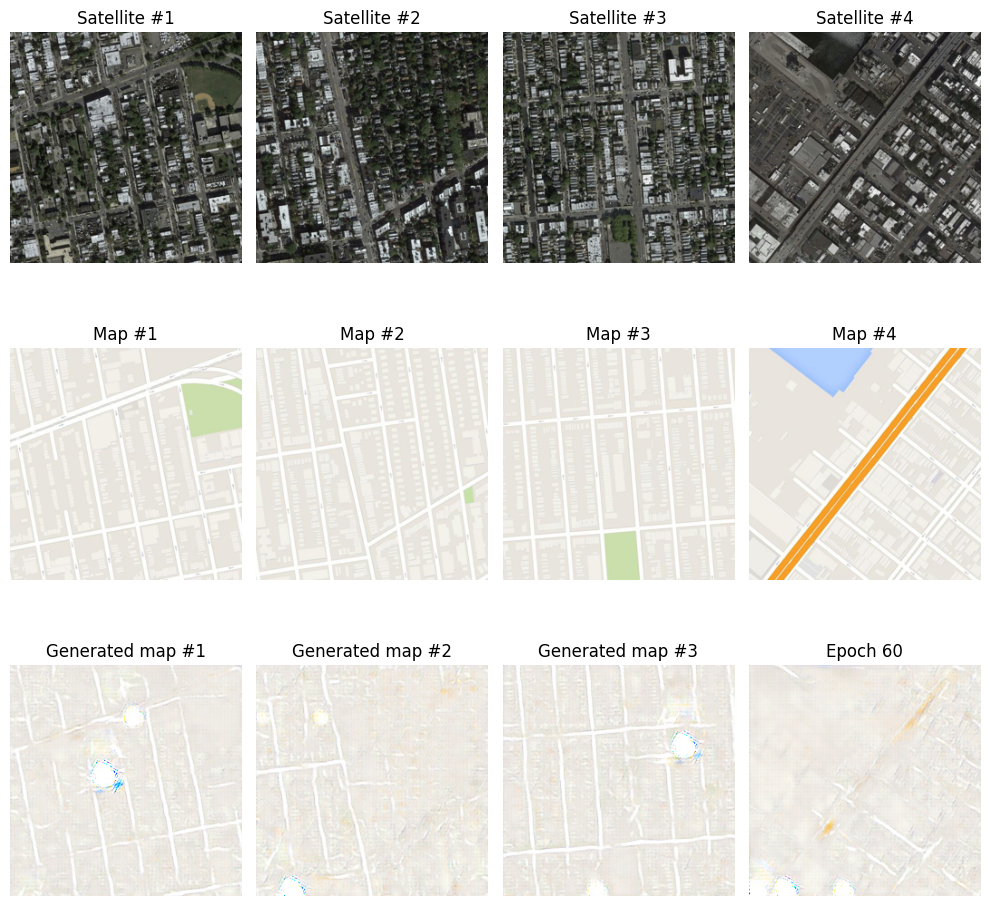

[Epoch 62/100]
Training


100%|██████████| 35/35 [08:39<00:00, 14.85s/it]


Validation


100%|██████████| 35/35 [03:39<00:00,  6.26s/it]


[G loss: 8.482589721679688] [D loss: 0.6744585037231445] ETA: 519.7992451190948
[Epoch 63/100]
Training


100%|██████████| 35/35 [07:40<00:00, 13.15s/it]


Validation


100%|██████████| 35/35 [03:26<00:00,  5.90s/it]


[G loss: 8.226363182067871] [D loss: 0.32842564582824707] ETA: 460.32992124557495
[Epoch 64/100]
Training


100%|██████████| 35/35 [07:51<00:00, 13.47s/it]


Validation


100%|██████████| 35/35 [03:27<00:00,  5.93s/it]


[G loss: 7.359566688537598] [D loss: 0.41251593828201294] ETA: 471.43980145454407
[Epoch 65/100]
Training


100%|██████████| 35/35 [07:40<00:00, 13.15s/it]


Validation


100%|██████████| 35/35 [03:25<00:00,  5.87s/it]


[G loss: 7.899676322937012] [D loss: 0.6426780819892883] ETA: 460.25230646133423
[Epoch 66/100]
Training


100%|██████████| 35/35 [07:51<00:00, 13.46s/it]


Validation


100%|██████████| 35/35 [03:29<00:00,  5.99s/it]


[G loss: 9.456664085388184] [D loss: 0.7167159914970398] ETA: 471.1901915073395
[Epoch 67/100]
Training


100%|██████████| 35/35 [07:46<00:00, 13.33s/it]


Validation


100%|██████████| 35/35 [03:29<00:00,  5.98s/it]


[G loss: 12.019340515136719] [D loss: 0.44696906208992004] ETA: 466.6964101791382
[Epoch 68/100]
Training


100%|██████████| 35/35 [07:41<00:00, 13.19s/it]


Validation


100%|██████████| 35/35 [03:23<00:00,  5.81s/it]


[G loss: 8.592799186706543] [D loss: 0.4194912612438202] ETA: 461.5724413394928
[Epoch 69/100]
Training


100%|██████████| 35/35 [07:38<00:00, 13.11s/it]


Validation


100%|██████████| 35/35 [03:25<00:00,  5.86s/it]


[G loss: 8.106261253356934] [D loss: 0.5235680937767029] ETA: 458.7094473838806
[Epoch 70/100]
Training


100%|██████████| 35/35 [07:39<00:00, 13.14s/it]


Validation


100%|██████████| 35/35 [03:16<00:00,  5.62s/it]


[G loss: 9.18537425994873] [D loss: 0.5478830337524414] ETA: 459.86224365234375
[Epoch 71/100]
Training


100%|██████████| 35/35 [07:36<00:00, 13.05s/it]


Validation


100%|██████████| 35/35 [03:17<00:00,  5.64s/it]


[G loss: 7.092457294464111] [D loss: 0.4743349254131317] ETA: 456.8278796672821
maps: 1.0, 0.2627451419830322
gen maps: 1.0, 0.28926166892051697
maps: 1.0, 0.2705882787704468
gen maps: 0.9999997615814209, 0.47474730014801025
maps: 1.0, 0.2862745523452759
gen maps: 1.0, -0.36109310388565063
maps: 1.0, -0.9372549057006836
gen maps: 1.0, -0.8384295701980591


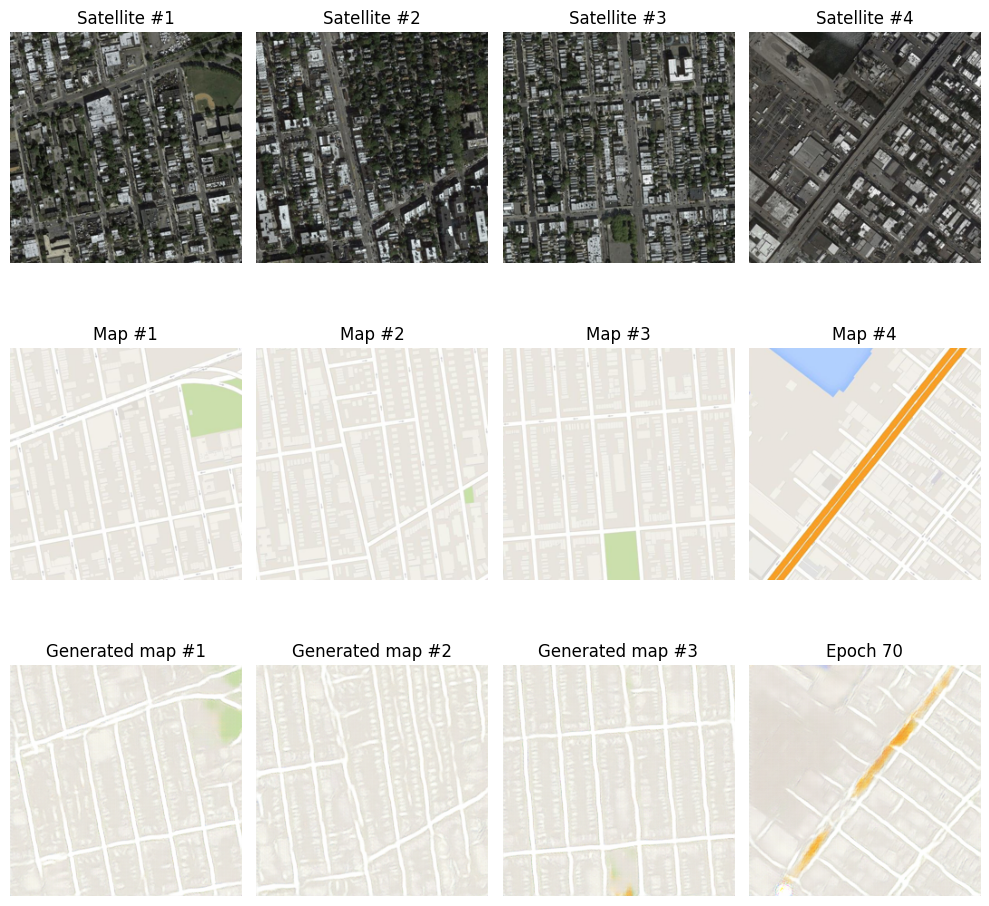

[Epoch 72/100]
Training


100%|██████████| 35/35 [07:35<00:00, 13.01s/it]


Validation


100%|██████████| 35/35 [03:14<00:00,  5.56s/it]


[G loss: 7.160740375518799] [D loss: 0.5729485750198364] ETA: 455.4339380264282
[Epoch 73/100]
Training


100%|██████████| 35/35 [07:32<00:00, 12.93s/it]


Validation


100%|██████████| 35/35 [03:17<00:00,  5.64s/it]


[G loss: 8.222710609436035] [D loss: 0.3548169732093811] ETA: 452.67463088035583
[Epoch 74/100]
Training


100%|██████████| 35/35 [07:31<00:00, 12.90s/it]


Validation


100%|██████████| 35/35 [03:10<00:00,  5.43s/it]


[G loss: 10.994129180908203] [D loss: 0.29389721155166626] ETA: 451.60673475265503
[Epoch 75/100]
Training


100%|██████████| 35/35 [07:34<00:00, 12.98s/it]


Validation


100%|██████████| 35/35 [03:09<00:00,  5.43s/it]


[G loss: 8.822660446166992] [D loss: 0.26765260100364685] ETA: 454.31423163414
[Epoch 76/100]
Training


100%|██████████| 35/35 [07:34<00:00, 13.00s/it]


Validation


100%|██████████| 35/35 [03:15<00:00,  5.58s/it]


[G loss: 8.252829551696777] [D loss: 0.3824125826358795] ETA: 454.8395822048187
[Epoch 77/100]
Training


100%|██████████| 35/35 [07:37<00:00, 13.08s/it]


Validation


100%|██████████| 35/35 [03:14<00:00,  5.57s/it]


[G loss: 9.630928993225098] [D loss: 0.3950016498565674] ETA: 457.96254110336304
[Epoch 78/100]
Training


100%|██████████| 35/35 [07:59<00:00, 13.70s/it]


Validation


100%|██████████| 35/35 [04:11<00:00,  7.18s/it]


[G loss: 6.593472480773926] [D loss: 0.4768185615539551] ETA: 479.5608673095703
[Epoch 79/100]
Training


100%|██████████| 35/35 [07:46<00:00, 13.32s/it]


Validation


100%|██████████| 35/35 [03:16<00:00,  5.62s/it]


[G loss: 6.367618560791016] [D loss: 0.4322053790092468] ETA: 466.2727816104889
[Epoch 80/100]
Training


100%|██████████| 35/35 [07:36<00:00, 13.05s/it]


Validation


100%|██████████| 35/35 [03:15<00:00,  5.59s/it]


[G loss: 10.588523864746094] [D loss: 0.4827960729598999] ETA: 456.74920868873596
[Epoch 81/100]
Training


100%|██████████| 35/35 [07:36<00:00, 13.03s/it]


Validation


100%|██████████| 35/35 [03:13<00:00,  5.51s/it]


[G loss: 9.982529640197754] [D loss: 0.3442600965499878] ETA: 456.16946959495544
maps: 1.0, 0.2627451419830322
gen maps: 1.0, -0.9999999403953552
maps: 1.0, 0.2705882787704468
gen maps: 1.0, -0.9879096150398254
maps: 1.0, 0.2862745523452759
gen maps: 1.0, -0.9975916743278503
maps: 1.0, -0.9372549057006836
gen maps: 1.0, -0.9940504431724548


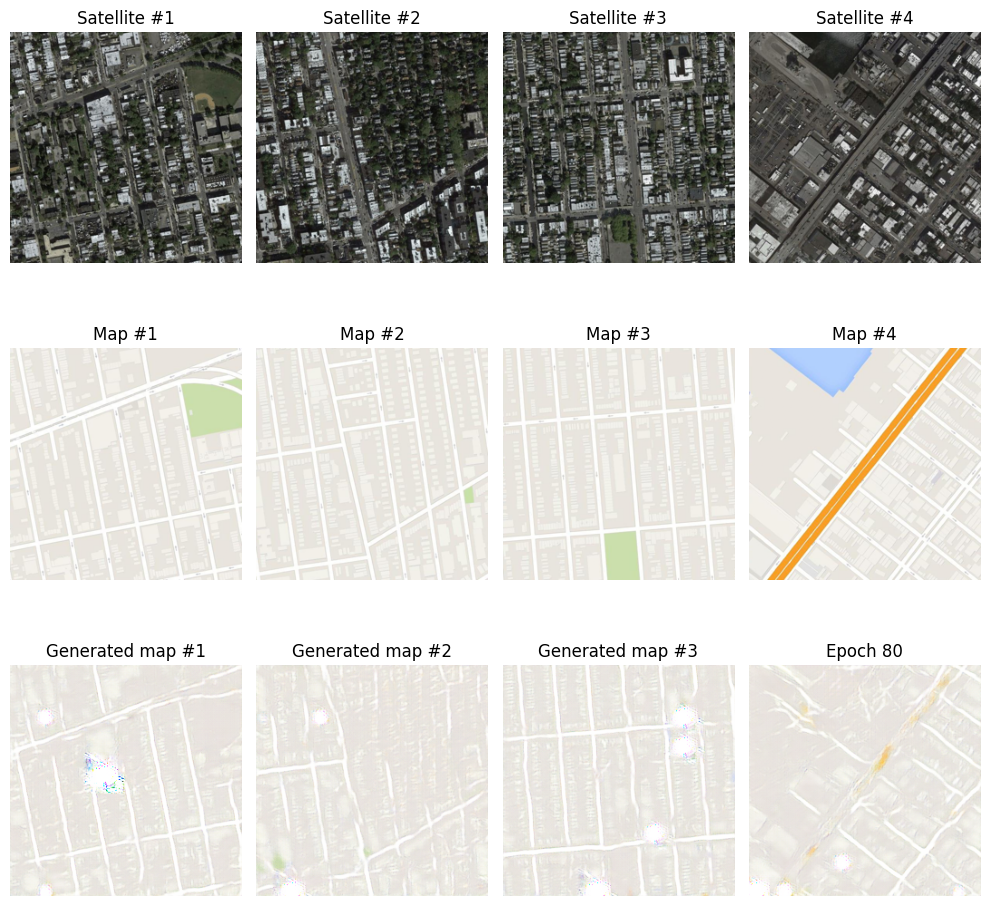

[Epoch 82/100]
Training


100%|██████████| 35/35 [07:29<00:00, 12.84s/it]


Validation


100%|██████████| 35/35 [03:13<00:00,  5.52s/it]


[G loss: 9.375212669372559] [D loss: 0.5229905843734741] ETA: 449.40912795066833
[Epoch 83/100]
Training


100%|██████████| 35/35 [07:35<00:00, 13.01s/it]


Validation


100%|██████████| 35/35 [03:13<00:00,  5.53s/it]


[G loss: 9.192045211791992] [D loss: 0.339934378862381] ETA: 455.29475474357605
[Epoch 84/100]
Training


100%|██████████| 35/35 [07:27<00:00, 12.79s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.48s/it]


[G loss: 10.193958282470703] [D loss: 0.2959648072719574] ETA: 447.7086992263794
[Epoch 85/100]
Training


100%|██████████| 35/35 [07:33<00:00, 12.96s/it]


Validation


100%|██████████| 35/35 [03:12<00:00,  5.50s/it]


[G loss: 9.422088623046875] [D loss: 0.3282091021537781] ETA: 453.5006670951843
[Epoch 86/100]
Training


100%|██████████| 35/35 [07:25<00:00, 12.72s/it]


Validation


100%|██████████| 35/35 [03:41<00:00,  6.32s/it]


[G loss: 8.33686637878418] [D loss: 0.4941679835319519] ETA: 445.1682982444763
[Epoch 87/100]
Training


100%|██████████| 35/35 [08:16<00:00, 14.19s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.47s/it]


[G loss: 9.3976469039917] [D loss: 0.3100873529911041] ETA: 496.4957046508789
[Epoch 88/100]
Training


100%|██████████| 35/35 [07:32<00:00, 12.94s/it]


Validation


100%|██████████| 35/35 [03:13<00:00,  5.54s/it]


[G loss: 9.021435737609863] [D loss: 0.5897997617721558] ETA: 452.76938819885254
[Epoch 89/100]
Training


100%|██████████| 35/35 [07:30<00:00, 12.86s/it]


Validation


100%|██████████| 35/35 [03:12<00:00,  5.51s/it]


[G loss: 7.256970405578613] [D loss: 0.31827670335769653] ETA: 450.2476797103882
[Epoch 90/100]
Training


100%|██████████| 35/35 [07:29<00:00, 12.86s/it]


Validation


100%|██████████| 35/35 [03:18<00:00,  5.66s/it]


[G loss: 8.641143798828125] [D loss: 0.3620678186416626] ETA: 449.96794033050537
[Epoch 91/100]
Training


100%|██████████| 35/35 [07:24<00:00, 12.70s/it]


Validation


100%|██████████| 35/35 [03:14<00:00,  5.57s/it]


[G loss: 15.067644119262695] [D loss: 0.2585117220878601] ETA: 444.4788508415222
maps: 1.0, 0.2627451419830322
gen maps: 1.0, 0.23439539968967438
maps: 1.0, 0.2705882787704468
gen maps: 1.0, 0.4778764843940735
maps: 1.0, 0.2862745523452759
gen maps: 1.0, 0.2763901948928833
maps: 1.0, -0.9372549057006836
gen maps: 1.0, 0.1265246719121933


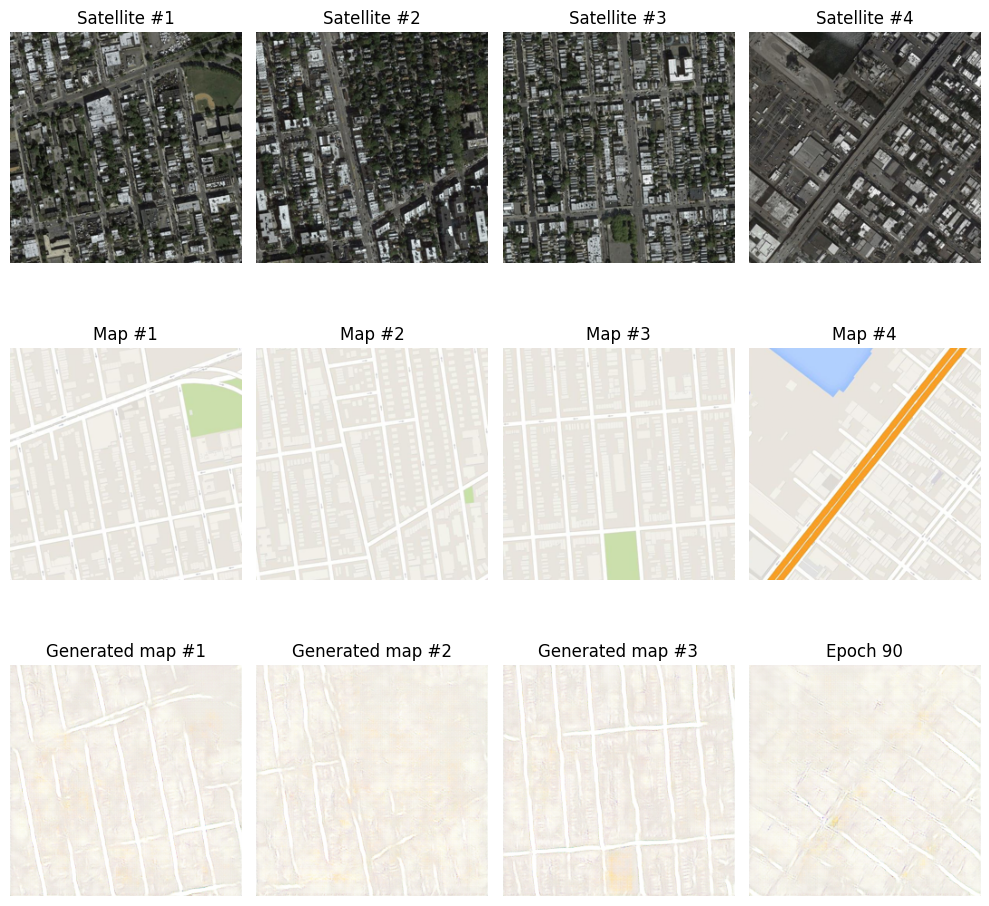

[Epoch 92/100]
Training


100%|██████████| 35/35 [07:23<00:00, 12.68s/it]


Validation


100%|██████████| 35/35 [03:12<00:00,  5.49s/it]


[G loss: 10.380167961120605] [D loss: 0.2680332362651825] ETA: 443.9266004562378
[Epoch 93/100]
Training


100%|██████████| 35/35 [07:18<00:00, 12.52s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.48s/it]


[G loss: 9.539878845214844] [D loss: 0.3659604489803314] ETA: 438.30645275115967
[Epoch 94/100]
Training


100%|██████████| 35/35 [07:22<00:00, 12.64s/it]


Validation


100%|██████████| 35/35 [03:14<00:00,  5.56s/it]


[G loss: 8.014199256896973] [D loss: 0.3023040294647217] ETA: 442.2489433288574
[Epoch 95/100]
Training


100%|██████████| 35/35 [08:52<00:00, 15.20s/it]


Validation


100%|██████████| 35/35 [03:17<00:00,  5.63s/it]


[G loss: 9.879756927490234] [D loss: 0.35158687829971313] ETA: 532.0567183494568
[Epoch 96/100]
Training


100%|██████████| 35/35 [07:23<00:00, 12.67s/it]


Validation


100%|██████████| 35/35 [03:13<00:00,  5.54s/it]


[G loss: 9.93956470489502] [D loss: 0.21325667202472687] ETA: 443.62018370628357
[Epoch 97/100]
Training


100%|██████████| 35/35 [07:19<00:00, 12.57s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.48s/it]


[G loss: 8.547128677368164] [D loss: 0.39877986907958984] ETA: 439.78499364852905
[Epoch 98/100]
Training


100%|██████████| 35/35 [07:29<00:00, 12.85s/it]


Validation


100%|██████████| 35/35 [03:11<00:00,  5.48s/it]


[G loss: 14.290958404541016] [D loss: 1.0662580728530884] ETA: 449.57716608047485
[Epoch 99/100]
Training


100%|██████████| 35/35 [07:33<00:00, 12.96s/it]


Validation


100%|██████████| 35/35 [03:16<00:00,  5.61s/it]


[G loss: 10.827030181884766] [D loss: 0.8325551748275757] ETA: 453.7479498386383
[Epoch 100/100]
Training


100%|██████████| 35/35 [07:33<00:00, 12.96s/it]


Validation


100%|██████████| 35/35 [03:14<00:00,  5.55s/it]

[G loss: 10.252251625061035] [D loss: 0.5520001649856567] ETA: 453.5271863937378


In [18]:
for epoch in range(hyperparams.n_epochs):
    print(f'[Epoch {epoch+1}/{hyperparams.n_epochs}]')
    # training
    generator.train()
    discriminator.train()
    train_loss_g=0.
    train_loss_d=0.
    start = time.time()
    tqdm.write('Training')
    for x, real in tqdm(train_dataloader):
        x = x.to(DEVICE)
        real = real.to(DEVICE)

        # Generator`s loss
        fake = generator(x)
        fake_pred = discriminator(fake, x)
        g_loss = g_criterion(fake, real, fake_pred)

        # Discriminator`s loss
        fake = generator(x).detach()
        fake_pred = discriminator(fake, x)
        real_pred = discriminator(real, x)
        d_loss = d_criterion(fake_pred, real_pred)

        # Generator`s params update
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        # Discriminator`s params update
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()

        # add batch losses
        train_loss_g += g_loss.item()
        train_loss_d += d_loss.item()

    # obtain per batch losses
    train_loss_g = train_loss_g/len(train_dataloader)
    train_loss_d = train_loss_d/len(train_dataloader)
    # count timeframe
    end = time.time()
    tm = (end - start)

    # validation
    generator.eval()
    discriminator.eval()
    val_loss_g=0.
    val_loss_d=0.
    tqdm.write('Validation')
    for x, real in tqdm(val_dataloader):
        x = x.to(DEVICE)
        real = real.to(DEVICE)

        with torch.no_grad():
            # Generator`s loss
            fake = generator(x)
            fake_pred = discriminator(fake, x)
            g_loss = g_criterion(fake, real, fake_pred)

            # Discriminator`s loss
            fake = generator(x).detach()
            fake_pred = discriminator(fake, x)
            real_pred = discriminator(real, x)
            d_loss = d_criterion(fake_pred, real_pred)

        # add batch losses
        val_loss_g += g_loss.item()
        val_loss_d += d_loss.item()
    
    # obtain per batch losses
    val_loss_g = val_loss_g/len(val_dataloader)
    val_loss_d = val_loss_d/len(val_dataloader)

    # logging
    wandb.log({"generator_train_loss": train_loss_g, 
               "generator_val_loss": val_loss_g, 
               "discriminator_train_loss": train_loss_d,
               "discriminator_val_loss": val_loss_d,
            #    "time": tm
               })
    print(f"[G loss: {g_loss}] [D loss: {d_loss}] ETA: {tm}")

    if epoch % 10!=0:
        continue
    
    # saving the model every 10 epochs
    torch.save({'gen_weights': generator.state_dict(), 
                'disc_weights': discriminator.state_dict()}, 
                f'../models/pix2pix/checkpoints/checkpoint_{epoch}.pth')

    # visualizing the results
    fig = plt.figure(figsize=(10, 10))
    random_batch = val_dataloader[torch.randint(0, len(val_dataloader), 4)]
    for i, (sat, map) in enumerate(random_batch):
        i = i + 1
        gen_map = generator(sat.unsqueeze(0).to(DEVICE)).squeeze(0).cpu()

        ax = fig.add_subplot(3, 4, i)
        ax.set_title('Satellite #{}'.format(i))
        ax.axis('off')
        sat = sat * 0.5 + 0.5
        plt.imshow(sat.permute((1, 2, 0)).numpy())

        ax = fig.add_subplot(3, 4, i+4)
        ax.set_title('Map #{}'.format(i))
        ax.axis('off')
        print(f'maps: {map.max()}, {map.min()}')
        map = map * 0.5 + 0.5
        plt.imshow(map.permute((1, 2, 0)).numpy())

        ax = fig.add_subplot(3, 4, i+8)
        ax.set_title('Generated map #{}'.format(i))
        ax.axis('off')
        print(f'gen maps: {gen_map.max()}, {gen_map.min()}')
        gen_map = gen_map * 0.5 + 0.5
        plt.imshow(gen_map.permute((1, 2, 0)).cpu().detach().numpy())
        if i == 4:
            fig.suptitle(f'Epoch {epoch+1}')
            fig.tight_layout()
            fig.subplots_adjust(top=0.88)
            plt.show()
            break

## Inference

In [20]:
gen_state_dict = torch.load('../models/pix2pix/checkpoints/checkpoint_100.pth')['gen_weights']
generator.load_state_dict(gen_state_dict)

/tmp/ipykernel_43951/3724911691.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gen_state_dict = torch.load('../models/pix2pix/checkpoints/checkpoint_100.pth')['gen_weig

<All keys matched successfully>

maps: 1.0, 0.21568632125854492
gen maps: 1.0, -0.649103045463562
maps: 1.0, 0.2549020051956177
gen maps: 1.0, -0.9815718531608582
maps: 1.0, -0.8980392217636108
gen maps: 1.0, -0.8215075731277466
maps: 1.0, 0.21568632125854492
gen maps: 1.0, -0.8469658493995667


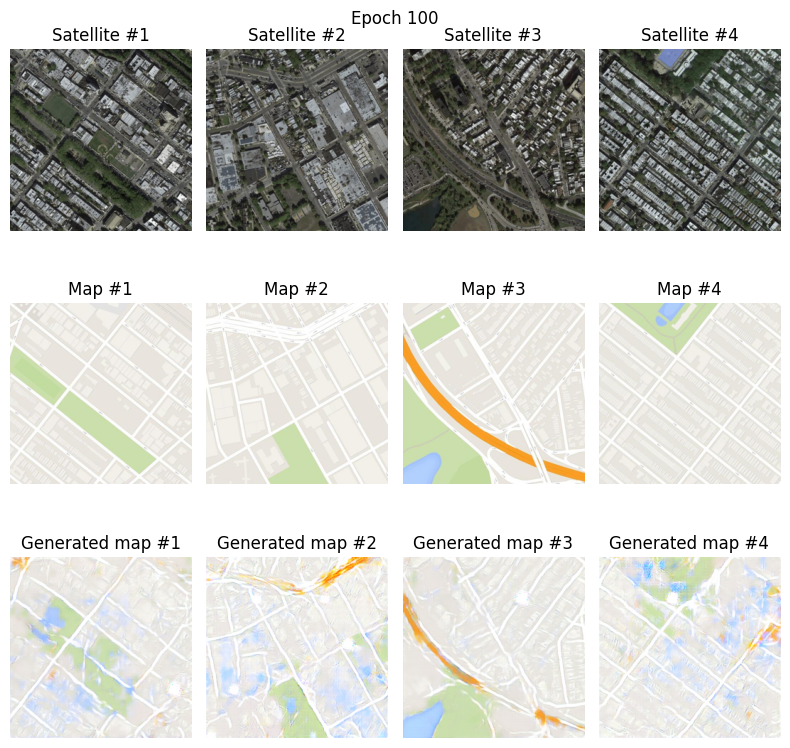

In [21]:
fig = plt.figure(figsize=(8, 8))
indexes = torch.randint(0, len(val_dataset), (4,))
for i in range(4):
    (sat, map) = val_dataset[indexes[i]]
    i = i + 1
    # print(i, sat.shape, map.shape)
    gen_map = generator(sat.unsqueeze(0).to(DEVICE)).squeeze(0).cpu()

    ax = fig.add_subplot(3, 4, i)
    ax.set_title('Satellite #{}'.format(i))
    ax.axis('off')
    sat = sat * 0.5 + 0.5
    plt.imshow(sat.permute((1, 2, 0)).numpy())

    ax = fig.add_subplot(3, 4, i+4)
    ax.set_title('Map #{}'.format(i))
    ax.axis('off')
    print(f'maps: {map.max()}, {map.min()}')
    map = map * 0.5 + 0.5
    plt.imshow(map.permute((1, 2, 0)).numpy())

    ax = fig.add_subplot(3, 4, i+8)
    ax.set_title('Generated map #{}'.format(i))
    ax.axis('off')
    print(f'gen maps: {gen_map.max()}, {gen_map.min()}')
    gen_map = gen_map * 0.5 + 0.5
    plt.imshow(gen_map.permute((1, 2, 0)).cpu().detach().numpy())
    if i == 4:
        fig.tight_layout()
        fig.suptitle('Epoch 100')
        plt.show()
        break

In [20]:
# saving the model every 10 epochs
torch.save({'gen_weights': generator.state_dict(), 
            'disc_weights': discriminator.state_dict()}, 
            f'../models/pix2pix/checkpoints/checkpoint_100.pth')